In [23]:
import geopandas as gpd
import esda
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from libpysal import graph

In [2]:
gdf = gpd.read_parquet('fbg_ntn.parquet')

In [4]:
gdf['% German']=gdf['% German']*100

remove nan values to calculate Moran's I

In [30]:
not_nan = ~np.isnan(gdf['% German'])

In [31]:
not_nan

ID
100mN27599E41570    True
100mN27599E41571    True
100mN27599E41572    True
100mN27599E41573    True
100mN27599E41574    True
                    ... 
100mN27800E41631    True
100mN27800E41632    True
100mN27800E41633    True
100mN27800E41634    True
100mN27800E41635    True
Name: % German, Length: 6965, dtype: bool

In [33]:
gdf = gdf[not_nan]

In [34]:
gdf

Category,Germany,Abroad,geometry,% German,lag,%G_std,%G_std_lag
ID,,,,,,,
100mN27599E41570,12.0,NaN,"POLYGON ((4157100 2760000, 4157100 2759900, 41...",100.000000,100.000000,0.669586,0.669586
100mN27599E41571,16.0,NaN,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",100.000000,100.000000,0.669586,0.669586
100mN27599E41572,23.0,NaN,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",100.000000,96.744186,0.669586,0.334962
100mN27599E41573,72.0,14.0,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",83.720930,98.285714,-1.003532,0.493396
100mN27599E41574,32.0,3.0,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",91.428571,96.744186,-0.211362,0.334962
...,...,...,...,...,...,...,...
100mN27800E41631,6.0,NaN,"POLYGON ((4163200 2780100, 4163200 2780000, 41...",100.000000,100.000000,0.669586,0.669586
100mN27800E41632,42.0,NaN,"POLYGON ((4163300 2780100, 4163300 2780000, 41...",100.000000,100.000000,0.669586,0.669586
100mN27800E41633,37.0,NaN,"POLYGON ((4163400 2780100, 4163400 2780000, 41...",100.000000,100.000000,0.669586,0.669586


In [35]:
gdf.explore(
    "% German",
    cmap="coolwarm",
    vmin=0,
    vmax=100,
    prefer_canvas=True,
    tiles="CartoDB Positron",
)

In [36]:
contiguity = graph.Graph.build_contiguity(gdf, rook=False)

In [37]:
contiguity

<Graph of 6909 nodes and 39474 nonzero edges indexed by
 ['100mN27599E41570', '100mN27599E41571', '100mN27599E41572', '100mN27599E41573', '100mN27599E41574', ...]>

In [38]:
contiguity['100mN27599E41570']

neighbor
100mN27599E41571    1
100mN27600E41570    1
100mN27600E41571    1
Name: weight, dtype: int64

In [39]:
contiguity_r = contiguity.transform("r")

In [40]:
contiguity_r['100mN27599E41570']

neighbor
100mN27599E41571    0.333333
100mN27600E41570    0.333333
100mN27600E41571    0.333333
Name: weight, dtype: float64

In [41]:
gdf['lag'] = contiguity_r.lag(gdf["% German"])
gdf.head()

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Category,Germany,Abroad,geometry,% German,lag,%G_std,%G_std_lag
ID,,,,,,,
100mN27599E41570,12.0,NaN,"POLYGON ((4157100 2760000, 4157100 2759900, 41...",100.000000,100.000000,0.669586,0.669586
100mN27599E41571,16.0,NaN,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",100.000000,100.000000,0.669586,0.669586
100mN27599E41572,23.0,NaN,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",100.000000,96.744186,0.669586,0.334962
100mN27599E41573,72.0,14.0,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",83.720930,98.285714,-1.003532,0.493396
100mN27599E41574,32.0,3.0,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",91.428571,96.744186,-0.211362,0.334962


In [42]:
gdf["%G_std"] = (
    gdf["% German"] - gdf["% German"].mean()
) / gdf["% German"].std()

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [43]:
gdf

Category,Germany,Abroad,geometry,% German,lag,%G_std,%G_std_lag
ID,,,,,,,
100mN27599E41570,12.0,NaN,"POLYGON ((4157100 2760000, 4157100 2759900, 41...",100.000000,100.000000,0.669586,0.669586
100mN27599E41571,16.0,NaN,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",100.000000,100.000000,0.669586,0.669586
100mN27599E41572,23.0,NaN,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",100.000000,96.744186,0.669586,0.334962
100mN27599E41573,72.0,14.0,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",83.720930,98.285714,-1.003532,0.493396
100mN27599E41574,32.0,3.0,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",91.428571,96.744186,-0.211362,0.334962
...,...,...,...,...,...,...,...
100mN27800E41631,6.0,NaN,"POLYGON ((4163200 2780100, 4163200 2780000, 41...",100.000000,100.000000,0.669586,0.669586
100mN27800E41632,42.0,NaN,"POLYGON ((4163300 2780100, 4163300 2780000, 41...",100.000000,100.000000,0.669586,0.669586
100mN27800E41633,37.0,NaN,"POLYGON ((4163400 2780100, 4163400 2780000, 41...",100.000000,100.000000,0.669586,0.669586


In [44]:
gdf["%G_std_lag"] = contiguity_r.lag(gdf["%G_std"])

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [45]:
gdf

Category,Germany,Abroad,geometry,% German,lag,%G_std,%G_std_lag
ID,,,,,,,
100mN27599E41570,12.0,NaN,"POLYGON ((4157100 2760000, 4157100 2759900, 41...",100.000000,100.000000,0.669586,0.669586
100mN27599E41571,16.0,NaN,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",100.000000,100.000000,0.669586,0.669586
100mN27599E41572,23.0,NaN,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",100.000000,96.744186,0.669586,0.334962
100mN27599E41573,72.0,14.0,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",83.720930,98.285714,-1.003532,0.493396
100mN27599E41574,32.0,3.0,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",91.428571,96.744186,-0.211362,0.334962
...,...,...,...,...,...,...,...
100mN27800E41631,6.0,NaN,"POLYGON ((4163200 2780100, 4163200 2780000, 41...",100.000000,100.000000,0.669586,0.669586
100mN27800E41632,42.0,NaN,"POLYGON ((4163300 2780100, 4163300 2780000, 41...",100.000000,100.000000,0.669586,0.669586
100mN27800E41633,37.0,NaN,"POLYGON ((4163400 2780100, 4163400 2780000, 41...",100.000000,100.000000,0.669586,0.669586


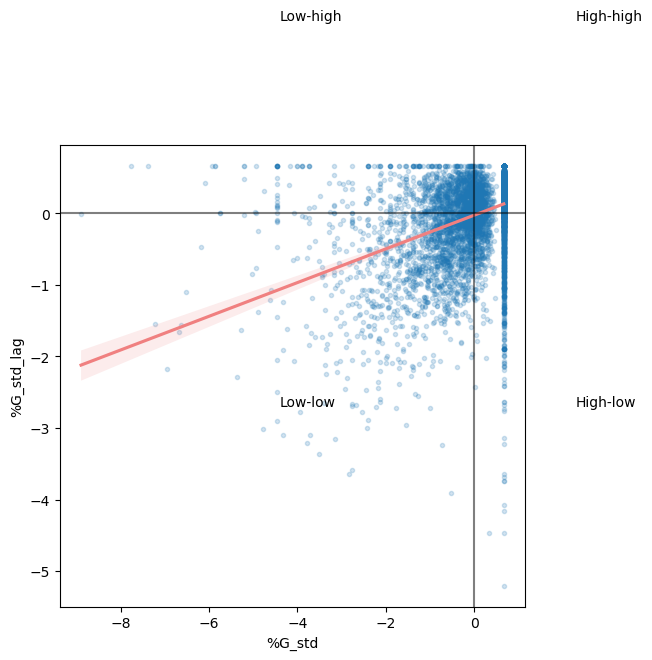

In [46]:
f, ax = plt.subplots(1, figsize=(6, 6))
sns.regplot(
    x="%G_std",
    y="%G_std_lag",
    data=gdf,
    marker=".",
    scatter_kws={"alpha": 0.2},
    line_kws=dict(color="lightcoral")
)
plt.axvline(0, c="black", alpha=0.5)
plt.axhline(0, c="black", alpha=0.5)
plt.text(2.3, 2.7, "High-high", fontsize=10)
plt.text(2.3, -2.7, "High-low", fontsize=10)
plt.text(-4.4, 2.7, "Low-high", fontsize=10)
plt.text(-4.4, -2.7, "Low-low", fontsize=10);

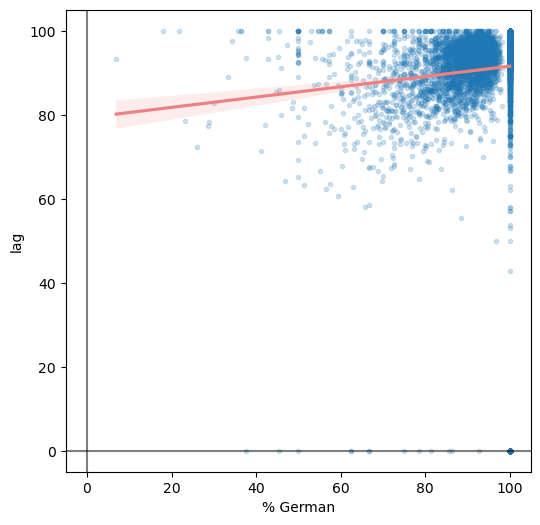

In [47]:
f, ax = plt.subplots(1, figsize=(6, 6))
sns.regplot(
    x="% German",
    y="lag",
    data=gdf,
    marker=".",
    scatter_kws={"alpha": 0.2},
    line_kws=dict(color="lightcoral")
)
plt.axvline(0, c="black", alpha=0.5)
plt.axhline(0, c="black", alpha=0.5);

In [48]:
mi = esda.Moran(gdf['% German'], contiguity_r.to_W())

('WARNING: ', '100mN27599E41603', ' is an island (no neighbors)')
('WARNING: ', '100mN27600E41595', ' is an island (no neighbors)')
('WARNING: ', '100mN27600E41699', ' is an island (no neighbors)')
('WARNING: ', '100mN27601E41617', ' is an island (no neighbors)')
('WARNING: ', '100mN27601E41637', ' is an island (no neighbors)')
('WARNING: ', '100mN27602E41672', ' is an island (no neighbors)')
('WARNING: ', '100mN27603E41511', ' is an island (no neighbors)')
('WARNING: ', '100mN27603E41697', ' is an island (no neighbors)')
('WARNING: ', '100mN27605E41598', ' is an island (no neighbors)')
('WARNING: ', '100mN27605E41677', ' is an island (no neighbors)')
('WARNING: ', '100mN27605E41693', ' is an island (no neighbors)')
('WARNING: ', '100mN27606E41583', ' is an island (no neighbors)')
('WARNING: ', '100mN27606E41670', ' is an island (no neighbors)')
('WARNING: ', '100mN27608E41666', ' is an island (no neighbors)')
('WARNING: ', '100mN27608E41668', ' is an island (no neighbors)')
('WARNING:

/opt/conda/lib/python3.11/site-packages/libpysal/graph/base.py:267: UserWarning: The weights matrix is not fully connected: 
 There are 349 disconnected components.
 There are 184 islands with ids: 100mN27599E41603, 100mN27600E41595, 100mN27600E41699, 100mN27601E41617, 100mN27601E41637, 100mN27602E41672, 100mN27603E41511, 100mN27603E41697, 100mN27605E41598, 100mN27605E41677, 100mN27605E41693, 100mN27606E41583, 100mN27606E41670, 100mN27608E41666, 100mN27608E41668, 100mN27610E41600, 100mN27610E41667, 100mN27611E41585, 100mN27611E41590, 100mN27611E41595, 100mN27611E41678, 100mN27612E41613, 100mN27613E41600, 100mN27614E41660, 100mN27615E41585, 100mN27615E41644, 100mN27616E41608, 100mN27617E41592, 100mN27617E41696, 100mN27619E41632, 100mN27620E41501, 100mN27620E41634, 100mN27621E41670, 100mN27622E41590, 100mN27623E41518, 100mN27623E41577, 100mN27623E41595, 100mN27624E41593, 100mN27624E41652, 100mN27624E41680, 100mN27625E41526, 100mN27625E41658, 100mN27625E41690, 100mN27625E41700, 100mN27626

In [49]:
mi.I

0.24197821483046592

In [51]:
print(f"Moran's I: {mi.I}, p-value: {mi.p_sim}")

Moran's I: 0.24197821483046592, p-value: 0.001


In [52]:
lisa = esda.Moran_Local(gdf['% German'], contiguity_r.to_W())

/opt/conda/lib/python3.11/site-packages/libpysal/graph/base.py:267: UserWarning: The weights matrix is not fully connected: 
 There are 349 disconnected components.
 There are 184 islands with ids: 100mN27599E41603, 100mN27600E41595, 100mN27600E41699, 100mN27601E41617, 100mN27601E41637, 100mN27602E41672, 100mN27603E41511, 100mN27603E41697, 100mN27605E41598, 100mN27605E41677, 100mN27605E41693, 100mN27606E41583, 100mN27606E41670, 100mN27608E41666, 100mN27608E41668, 100mN27610E41600, 100mN27610E41667, 100mN27611E41585, 100mN27611E41590, 100mN27611E41595, 100mN27611E41678, 100mN27612E41613, 100mN27613E41600, 100mN27614E41660, 100mN27615E41585, 100mN27615E41644, 100mN27616E41608, 100mN27617E41592, 100mN27617E41696, 100mN27619E41632, 100mN27620E41501, 100mN27620E41634, 100mN27621E41670, 100mN27622E41590, 100mN27623E41518, 100mN27623E41577, 100mN27623E41595, 100mN27624E41593, 100mN27624E41652, 100mN27624E41680, 100mN27625E41526, 100mN27625E41658, 100mN27625E41690, 100mN27625E41700, 100mN27626

('WARNING: ', '100mN27599E41603', ' is an island (no neighbors)')
('WARNING: ', '100mN27600E41595', ' is an island (no neighbors)')
('WARNING: ', '100mN27600E41699', ' is an island (no neighbors)')
('WARNING: ', '100mN27601E41617', ' is an island (no neighbors)')
('WARNING: ', '100mN27601E41637', ' is an island (no neighbors)')
('WARNING: ', '100mN27602E41672', ' is an island (no neighbors)')
('WARNING: ', '100mN27603E41511', ' is an island (no neighbors)')
('WARNING: ', '100mN27603E41697', ' is an island (no neighbors)')
('WARNING: ', '100mN27605E41598', ' is an island (no neighbors)')
('WARNING: ', '100mN27605E41677', ' is an island (no neighbors)')
('WARNING: ', '100mN27605E41693', ' is an island (no neighbors)')
('WARNING: ', '100mN27606E41583', ' is an island (no neighbors)')
('WARNING: ', '100mN27606E41670', ' is an island (no neighbors)')
('WARNING: ', '100mN27608E41666', ' is an island (no neighbors)')
('WARNING: ', '100mN27608E41668', ' is an island (no neighbors)')
('WARNING:

/opt/conda/lib/python3.11/site-packages/esda/moran.py:1059: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


In [53]:
gdf.loc[lisa.p_sim < 0.05, 'cluster'] = lisa.q[lisa.p_sim < 0.05]
gdf["cluster"] = gdf["cluster"].fillna(0)
gdf["cluster"] = gdf["cluster"].map(
    {
        0: "Not significant",
        1: "High-high",
        2: "Low-high",
        3: "Low-low",
        4: "High-low",
    }
)
gdf.head()

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Category,Germany,Abroad,geometry,% German,lag,%G_std,%G_std_lag,cluster
ID,,,,,,,,
100mN27599E41570,12.0,NaN,"POLYGON ((4157100 2760000, 4157100 2759900, 41...",100.000000,100.000000,0.669586,0.669586,Not significant
100mN27599E41571,16.0,NaN,"POLYGON ((4157200 2760000, 4157200 2759900, 41...",100.000000,100.000000,0.669586,0.669586,High-high
100mN27599E41572,23.0,NaN,"POLYGON ((4157300 2760000, 4157300 2759900, 41...",100.000000,96.744186,0.669586,0.334962,Not significant
100mN27599E41573,72.0,14.0,"POLYGON ((4157400 2760000, 4157400 2759900, 41...",83.720930,98.285714,-1.003532,0.493396,Not significant
100mN27599E41574,32.0,3.0,"POLYGON ((4157500 2760000, 4157500 2759900, 41...",91.428571,96.744186,-0.211362,0.334962,Not significant


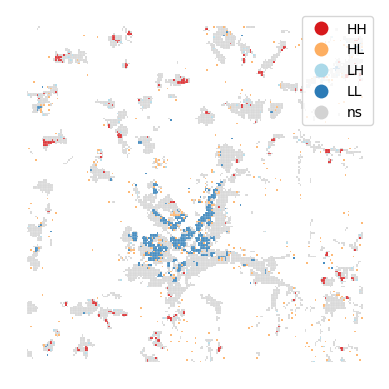

In [54]:
from splot.esda import lisa_cluster, moran_scatterplot

_ = lisa_cluster(lisa, gdf)

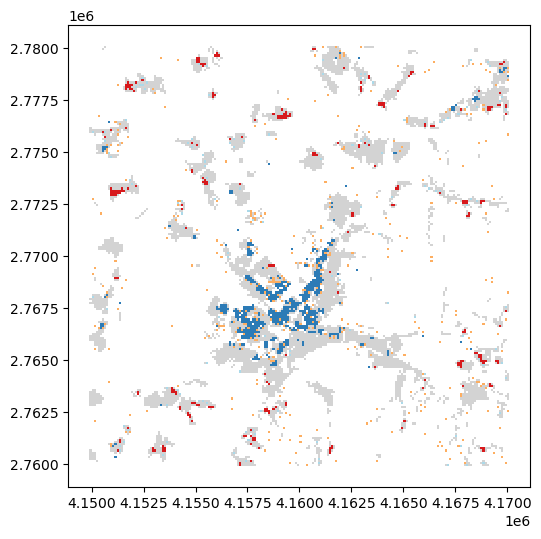

In [58]:
f, ax = plt.subplots(1, figsize=(6, 6))
gdf.loc[gdf["cluster"] == "Not significant"].plot(ax=ax, color="lightgrey")
gdf.loc[(gdf["cluster"] == "High-high")].plot(ax=ax, color="#d7191c")
gdf.loc[(gdf["cluster"] == "Low-low")].plot(ax=ax, color="#2c7bb6")
gdf.loc[(gdf["cluster"] == "Low-high")].plot(ax=ax, color="#abd9e9")
gdf.loc[(gdf["cluster"] == "High-low")].plot(ax=ax, color="#fdae61");

In [66]:
gdf.explore("cluster", prefer_canvas=True)

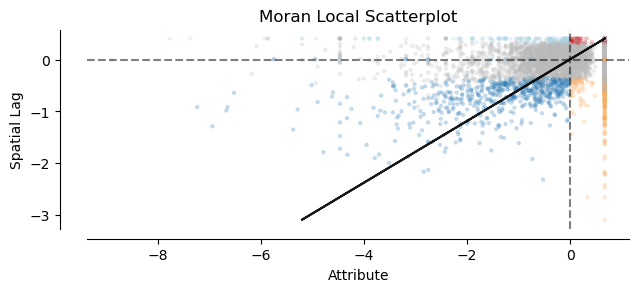

In [60]:
_ = moran_scatterplot(lisa, p=0.05, scatter_kwds={"s": 5, "alpha":.2})